In [1]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import numpy as np
import os
from skimage.feature import hog
from skimage.color import rgb2gray

In [2]:
# Chargement des images de test
imgs_test_f = [
    os.path.splitext(f)[0]
    for f in os.listdir(
        os.path.join("data", "test")
    )
    if f.endswith(".jpg")
]

imgs_test = {}
imgs_test_rgb = {}

for f in imgs_test_f:
    try:
        img = plt.imread(
            os.path.join(
                "data", "test", f"{f}.jpg"
            )
        )
        imgs_test[f] = rgb2gray(img)
        imgs_test_rgb[f] = img
    except FileNotFoundError:
        continue

print(len(imgs_test))

82


In [3]:
# Lecture des résultats de test
import json
with open(os.path.join("test_data", "test_windows.json"), "r") as f:
      test_windows = json.load(f)
with open(os.path.join("test_data", "test_scores.json"), "r") as f:
      test_scores = json.load(f)

C:\Users\Adrien\AppData\Local\Temp\ipykernel_9972\70857842.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


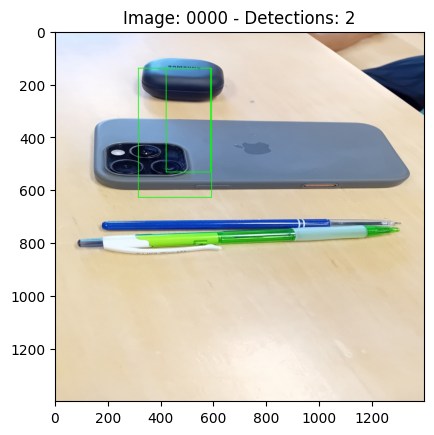

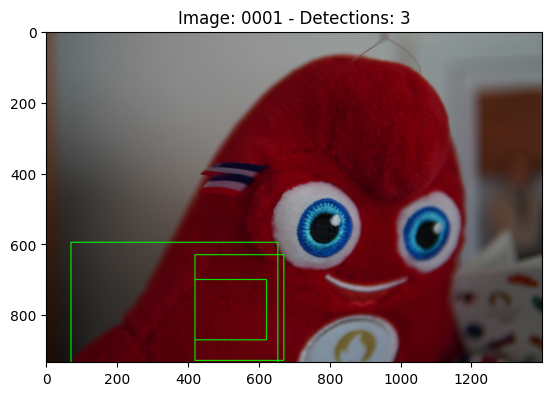

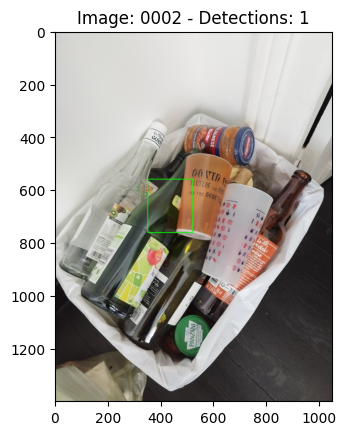

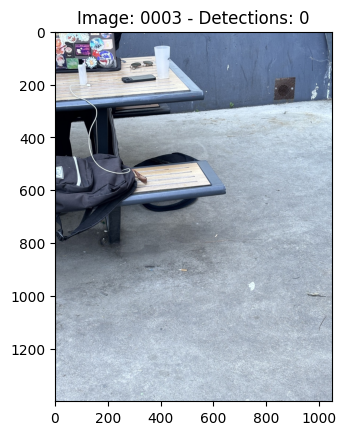

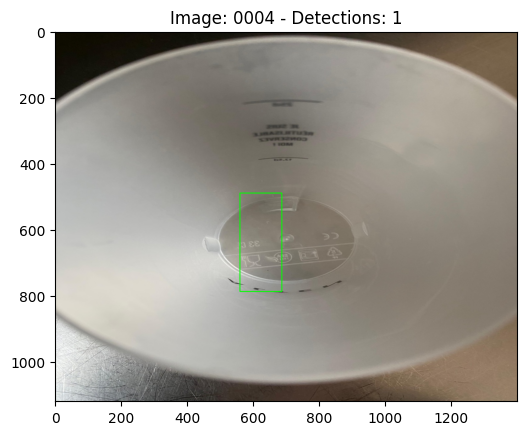

...

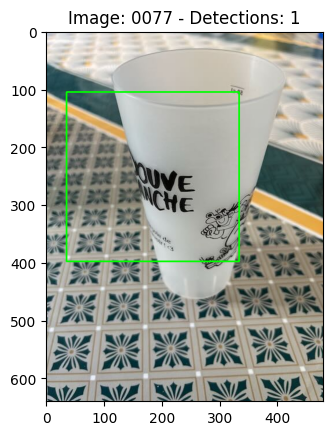

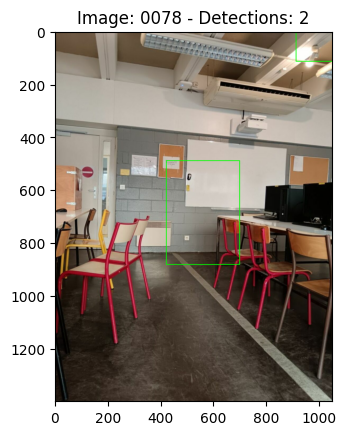

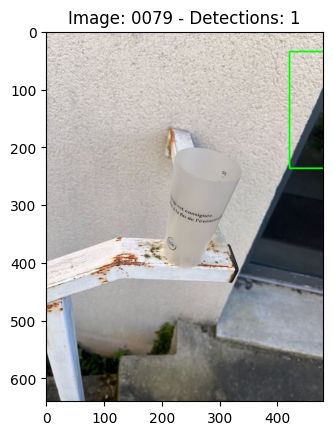

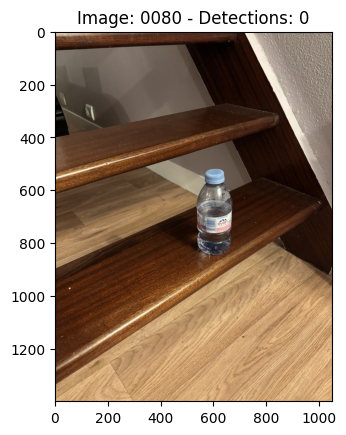

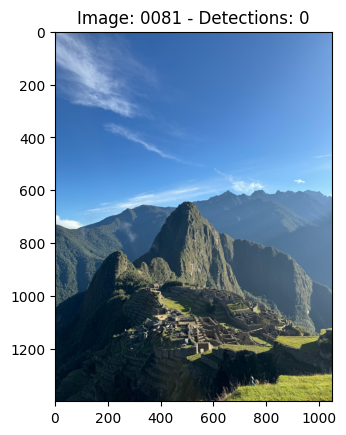

In [19]:
import importlib
import utils.detection
importlib.reload(utils.detection)
non_maxima_suppression_v2 = utils.detection.non_maxima_suppression_v2

import utils.visual
importlib.reload(utils.visual)
draw_boxes_on_image = utils.visual.draw_boxes_on_image

filter_confidence = 1-1e-2

for f in imgs_test_rgb.keys():
    img_rgb = imgs_test_rgb[f]
    all_windows = np.array(test_windows[f])
    all_scores = np.array(test_scores[f])

    best_windows = non_maxima_suppression_v2(all_windows, all_scores, iou_decision_criteria=0.5, score_decision_criteria=filter_confidence)

    # Extraire les coordonnées des meilleures fenêtres
    detections = [(window[0], window[1]) for window in best_windows]

    # Affichage des résultats
    hh = draw_boxes_on_image(img_rgb, detections)
    plt.figure()
    plt.title(f"Image: {f} - Detections: {len(detections)}")
    plt.imshow(hh)

plt.show()

In [ ]:
# Fabrication des données de soumission sur le site : https://robotics.gi.utc.fr/SY32/projet/
# Format : Num img, Coin h-g y,Coin h-g x, Hauteur,Largeur, Score en .csv

filter_confidence = 1 - 1e-2 


import csv
with open(os.path.join("test_data", "submission.csv"), "w", newline='') as csvfile:
    fieldnames = ['Num img', 'Coin h-g y', 'Coin h-g x', 'Hauteur', 'Largeur', 'Score']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    
    writer.writeheader()
    
    for f in imgs_test_rgb.keys():
        all_windows = np.array(test_windows[f])
        all_scores = np.array(test_scores[f])

        best_windows, best_scores = non_maxima_suppression_v2(all_windows, all_scores, iou_decision_criteria=0.5, score_decision_criteria=filter_confidence,output_score=True)

        detections = [(window[0], window[1]) for window in best_windows]  # (x1, y1, x2, y2)

        transfo = [(x[0][1], x[0][0], x[1][1] - x[0][1], x[1][0] - x[0][0]) for x in detections]  # (y, x, h, w)
        
        for i, t in enumerate (transfo):
            y, x, h, w = t
            score = best_scores[i]
            writer.writerow({
                'Num img': f,
                'Coin h-g y': y,
                'Coin h-g x': x,
                'Hauteur': h,
                'Largeur': w,
                'Score': score
            })

            